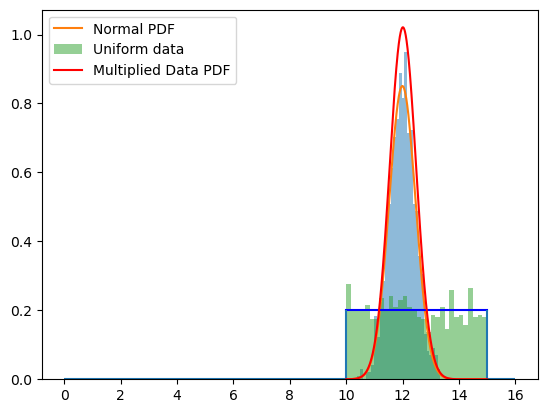

In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
from scipy.stats import norm


a= 10
b= 15

np.random.seed(10)
x_normal = np.random.normal(12, 0.5, 1000) 

def normal_pdf(x, mean, std):
  return (1 / (std * np.sqrt(2*np.pi))) * np.exp(-(x - mean)**2 / (2*std**2))

y_normal = normal_pdf(x_normal, 12, 0.5)
x_values = np.linspace(a, b, 1000)
pdf_values = norm.pdf(x_values, loc= np.mean(x_normal), scale= np.std(x_normal))

np.random.seed(15) 
uniform_dist = np.random.uniform(a, b, 1000)
uniform_values = np.linspace(a, b, 1000)
y_axis = np.ones_like(uniform_values) / (b-a)

pdf_combined = np.zeros_like(pdf_values)  
for i in range (len(pdf_values)):
  pdf_combined[i] = (pdf_values[i] * uniform_values[i]) / 10



plt.hist(x_normal, bins= 30, density= True, alpha= 0.5)
plt.plot(x_values, pdf_values, label= 'Normal PDF')
plt.hist(uniform_dist, bins= 30, density=True, alpha= 0.5, label= 'Uniform data')
plt.plot(uniform_values, y_axis, color= 'blue')
plt.hlines(0,0,10)
plt.hlines(0,15,16)
plt.vlines(10,0,0.2)
plt.vlines(15,0,0.2)
plt.plot(x_values, pdf_combined, label='Multiplied Data PDF', color='red')
plt.legend()
plt.show()





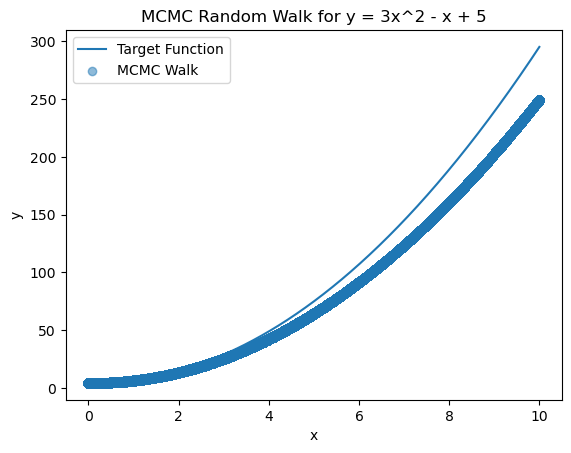

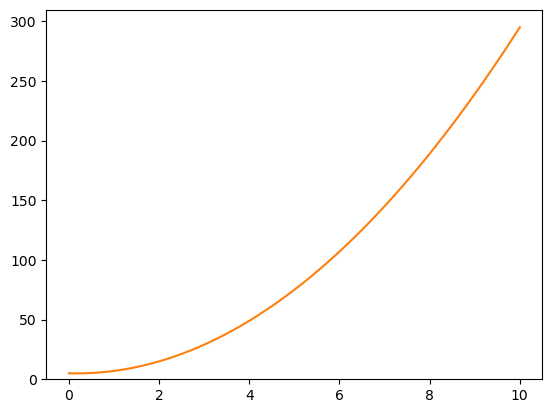

In [2]:
import numpy as np 
import matplotlib.pyplot as plt 

np.random.seed(10) 
x = np.linspace(0,10,1000)
def target_function(x, a, b, c):
  return a * x**2 + b * x + c
a,b,c = 2.5, -0.5, 4.5
n_interactions = 1000
tolerance = 0.1

data_x = []
data_y = []

for _ in range(n_interactions):
  a_new = a + np.random.normal(scale= 0.1)
  b_new = b + np.random.normal(scale= 0.1)
  c_new = c + np.random.normal(scale= 0.1)
  
  y_new = target_function(x, a_new, b_new, c_new)
  y_current = target_function(x, a, b, c)

  acceptance_ratio = np.exp((y_new - y_current) / tolerance)
  mask = acceptance_ratio > np.random.rand(len(x))  
  initial_coefficients = np.array([a, b, c]).reshape(-1, 1)

  if np.any(acceptance_ratio > np.random.rand()):
    a, b, c = initial_coefficients[:, 0]

  data_x.append(x)
  data_y.append(target_function(x, a, b, c))

plt.plot(x, target_function(x, 3, -1, 5), label="Target Function")  # True values for a, b, c
plt.scatter(data_x, data_y, alpha=0.5, label="MCMC Walk")
plt.xlabel("x")
plt.ylabel("y")
plt.title("MCMC Random Walk for y = 3x^2 - x + 5")
plt.legend()
plt.show()

plt.hist(x, bins = 30, density= True)
plt.plot(x,target_function(x, 3, -1, 5))

plt.show()

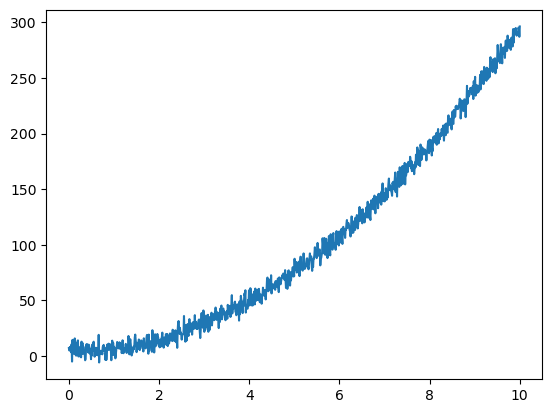

In [3]:
import numpy as np
import matplotlib.pyplot as plt 

x = np.linspace(0, 10, 1000)

y = 3 * x**2 - x + 5 + np.random.normal(scale= 5, size= 1000)


plt.plot(x, y)


In [4]:
import numpy as np 

np.random.seed(10)
a_new, b_new, c_new = 0,0,0 
a, b, c = 0,0,0
x = np.linspace(0, 10, 1000)
y = 3 * x**2 - x + 5 + np.random.normal(scale= 5, size= 1000)

def sum_square(y1, y2):
    return np.sum(np.power(y1 - y2, 2))

def normal_pdf(y, mean, std):
  return (1 / (std * np.sqrt(2*np.pi))) * np.exp(-(x - mean)**2 / (2*std**2))


for i in range(1000): 
   a_new = a + np.random.normal(scale= 1)
   b_new = b + np.random.normal(scale= 1)
   c_new = c + np.random.normal(scale= 1)

   y_current= target_function(x, a, b, c)
   y_new = target_function(x, a_new, b_new, c_new)

   new_error= sum_square(y_new,y)
   curr_error = sum_square(y_current,y)

   if new_error > curr_error: 
      a = a_new
      b = b_new 
      c = c_new

# for _ in range(1000):
#    a_new = a + np.random.normal(scale= 1)
#    b_new = b + np.random.normal(scale= 1)
#    c_new = c + np.random.normal(scale= 1)

#    y_new = target_function(x, a_new, b_new, c_new)
#    y_current= target_function(x, a, b, c)
  
#    new_error = sum_square(y_new, y)
#    curr_error = sum_square(y_current, y)

#    if new_error < curr_error: 
#       a = a_new
#       b = b_new 
#       c = c_new

# plt.plot(x, y)
# plt.plot(x, y_new)

   

  




In [5]:
import numpy as np

np.random.seed(20)

x = np.linspace(0,10, 1000)
y = 3 * x**2 - x + 5 + np.random.normal(scale= 5, size= 1000)

def normal_pdf(x, mean, std):
  return (1 / (std * np.sqrt(2*np.pi))) * np.exp(-(x - mean)**2 / (2*std**2))

def model(x,a,b,c): 
  return a * x**2 + b * x + c

def monte_carlo_with_pdf(x, y, std_dev=5, iterations=10000,epsilon=1e-10):
    best_a, best_b, best_c = 0, 0, 0
    a,b,c = 0,0,0
    max_likelihood = -float('inf')

    for i in range(iterations): 
      a_new = a + np.random.normal(0,0.5)
      b_new = b + np.random.normal(0,0.5)
      c_new = c + np.random.normal(0,0.5)

      y_pred = model(x,a_new,b_new,c_new)
      pdf_values = normal_pdf(y,y_pred, std_dev)
      likelihood = np.sum(np.log(pdf_values + epsilon))

      print(f"Iteration {i}:")
      print(f"  Current coefficients: a = {best_a}, b = {best_b}, c = {best_c}")
      print(f"  Proposed coefficients: a_new = {a_new}, b_new = {b_new}, c_new = {c_new}")
      print(f"  Current likelihood: {max_likelihood}")
      print(f"  Proposed likelihood: {likelihood}")
      print(f"  Best coefficients so far: a = {best_a}, b = {best_b}, c = {best_c}")
      
      if likelihood > max_likelihood:
         max_likelihood = likelihood 
         best_a,best_b,best_c = a_new,b_new,c_new 
         a,b,c = best_a, best_b, best_c
      elif (likelihood - max_likelihood) > np.random.uniform(0,1):
         max_likelihood = likelihood
         best_a,best_b,best_c = a_new,b_new,c_new 
         a,b,c = best_a, best_b, best_c
    return best_a,best_b,best_c, max_likelihood       
        

best_a, best_b, best_c, max_likelihood = monte_carlo_with_pdf(x, y)
print(f"Best coefficients: a = {best_a}, b = {best_b}, c = {best_c}")
print(f"Maximum likelihood: {max_likelihood}")

Iteration 0:
  Current coefficients: a = 0, b = 0, c = 0
  Proposed coefficients: a_new = 0.07080107615676455, b_new = -0.27497372013161986, c_new = 0.5671466363861165
  Current likelihood: -inf
  Proposed likelihood: -18145.64595565461
  Best coefficients so far: a = 0, b = 0, c = 0
Iteration 1:
  Current coefficients: a = 0.07080107615676455, b = -0.27497372013161986, c = 0.5671466363861165
  Proposed coefficients: a_new = 0.4665723134545383, b_new = -0.29266913359112146, c_new = 0.46963593998800135
  Current likelihood: -18145.64595565461
  Proposed likelihood: -17788.859296615665
  Best coefficients so far: a = 0.07080107615676455, b = -0.27497372013161986, c = 0.5671466363861165
Iteration 2:
  Current coefficients: a = 0.4665723134545383, b = -0.29266913359112146, c = 0.46963593998800135
  Proposed coefficients: a_new = -0.05252182673423644, b_new = -0.07072865302397452, c_new = 0.9499659553042274
  Current likelihood: -17788.859296615665
  Proposed likelihood: -18118.386254264795

Iteration 5535:
  Current coefficients: a = 3.01055612800156, b = -1.1390554704853764, c = 5.4288657948967876
  Proposed coefficients: a_new = 3.016116036924719, b_new = -1.6328040454550248, c_new = 4.625756185179483
  Current likelihood: -3011.272759119626
  Proposed likelihood: -3226.1320051868047
  Best coefficients so far: a = 3.01055612800156, b = -1.1390554704853764, c = 5.4288657948967876
Iteration 5536:
  Current coefficients: a = 3.01055612800156, b = -1.1390554704853764, c = 5.4288657948967876
  Proposed coefficients: a_new = 2.5315956514846905, b_new = -1.1713602834560521, c_new = 5.3483569591213485
  Current likelihood: -3011.272759119626
  Proposed likelihood: -9819.297612929115
  Best coefficients so far: a = 3.01055612800156, b = -1.1390554704853764, c = 5.4288657948967876
Iteration 5537:
  Current coefficients: a = 3.01055612800156, b = -1.1390554704853764, c = 5.4288657948967876
  Proposed coefficients: a_new = 4.2703847352963935, b_new = -1.637658677117925, c_new = 5.

In [6]:
import numpy as np

np.random.seed(20)

x = np.linspace(0, 10, 1000)
y = 3 * x**2 - x + 5 + np.random.normal(scale=5, size=1000)

def normal_pdf(x, mean, std):
    return (1 / (std * np.sqrt(2 * np.pi))) * np.exp(-(x - mean)**2 / (2 * std**2))

def model(x, a, b, c):
    return a * x**2 + b * x + c

def monte_carlo_with_pdf(x, y, std_dev=5, iterations=10000, epsilon=1e-10):
    # Initial values (can be random or zeros)
    a, b, c = np.random.uniform(-1, 1, 3)
    max_likelihood = -float('inf')
    
    # Best coefficients initialization
    best_a, best_b, best_c = a, b, c
    
    for i in range(iterations):
        # Proposal step: generate new candidate coefficients
        a_new = a + np.random.normal(0, 0.5)
        b_new = b + np.random.normal(0, 0.5)
        c_new = c + np.random.normal(0, 0.5)
        
        # Compute the predicted y values and the likelihood
        y_pred_new = model(x, a_new, b_new, c_new)
        pdf_values_new = normal_pdf(y, y_pred_new, std_dev)
        likelihood_new = np.sum(np.log(pdf_values_new + epsilon))
        
        # Compute the acceptance probability
        y_pred = model(x, a, b, c)
        pdf_values = normal_pdf(y, y_pred, std_dev)
        likelihood = np.sum(np.log(pdf_values + epsilon))
        
        acceptance_prob = np.exp(likelihood_new - likelihood)

        print(f"Iteration {i}:")
        print(f"  Current coefficients: a = {a}, b = {b}, c = {c}")
        print(f"  Proposed coefficients: a_new = {a_new}, b_new = {b_new}, c_new = {c_new}")
        print(f"  Current likelihood: {likelihood}")
        print(f"  Proposed likelihood: {likelihood_new}")
        print(f"  Acceptance probability: {acceptance_prob}")
        print(f"  Max likelihood: {max_likelihood}")
        print(f"  Best coefficients so far: a = {best_a}, b = {best_b}, c = {best_c}")
        
        # Accept or reject the new state
        if likelihood_new > likelihood or np.random.uniform(0, 1) < acceptance_prob:
            a, b, c = a_new, b_new, c_new
            if likelihood_new > max_likelihood:
                max_likelihood = likelihood_new
                best_a, best_b, best_c = a_new, b_new, c_new
    
    return best_a, best_b, best_c, max_likelihood

# Perform the Metropolis-Hastings simulation
best_a, best_b, best_c, max_likelihood = monte_carlo_with_pdf(x, y)
print(f"Best coefficients: a = {best_a}, b = {best_b}, c = {best_c}")
print(f"Maximum likelihood: {max_likelihood}")


Iteration 0:
  Current coefficients: a = -0.8934011915936522, b = 0.23003567677045322, c = 0.35471512823859586
  Proposed coefficients: a_new = -0.005369846107265541, b_new = -0.31927475572142094, c_new = 0.12231869085214575
  Current likelihood: -18692.95269318287
  Proposed likelihood: -18292.35970858542
  Acceptance probability: 9.447626155560898e+173
  Max likelihood: -inf
  Best coefficients so far: a = -0.8934011915936522, b = 0.23003567677045322, c = 0.35471512823859586
Iteration 1:
  Current coefficients: a = -0.005369846107265541, b = -0.31927475572142094, c = 0.12231869085214575
  Proposed coefficients: a_new = -0.5066901260649739, b_new = -0.19927784137175114, c_new = 0.6992914992780269
  Current likelihood: -18292.35970858542
  Proposed likelihood: -18523.04642186484
  Acceptance probability: 6.516784718546943e-101
  Max likelihood: -18292.35970858542
  Best coefficients so far: a = -0.005369846107265541, b = -0.31927475572142094, c = 0.12231869085214575
Iteration 2:
  Curr

C:\Users\ntk00\AppData\Local\Temp\ipykernel_6284\180213239.py:38: RuntimeWarning: overflow encountered in exp
  acceptance_prob = np.exp(likelihood_new - likelihood)


Iteration 3422:
  Current coefficients: a = 3.0329402294267207, b = -1.3212054456168145, c = 5.120434767444494
  Proposed coefficients: a_new = 4.154670723209306, b_new = -1.5955104797724493, c_new = 5.171964375902482
  Current likelihood: -3014.3575491054125
  Proposed likelihood: -14018.913886261147
  Acceptance probability: 0.0
  Max likelihood: -3012.944050458132
  Best coefficients so far: a = 3.0133349116043, b = -1.0648451044413658, c = 5.08607893776871
Iteration 3423:
  Current coefficients: a = 3.0329402294267207, b = -1.3212054456168145, c = 5.120434767444494
  Proposed coefficients: a_new = 3.255305311248141, b_new = -1.5029551626926365, c_new = 4.759233375839348
  Current likelihood: -3014.3575491054125
  Proposed likelihood: -4448.235076462461
  Acceptance probability: 0.0
  Max likelihood: -3012.944050458132
  Best coefficients so far: a = 3.0133349116043, b = -1.0648451044413658, c = 5.08607893776871
Iteration 3424:
  Current coefficients: a = 3.0329402294267207, b = -1.

Iteration 6553:
  Current coefficients: a = 2.990226980701012, b = -0.8589730007328548, c = 4.829267929268023
  Proposed coefficients: a_new = 1.9775252295665888, b_new = -0.5489523749030248, c_new = 5.658324146785042
  Current likelihood: -3013.0907103585787
  Proposed likelihood: -13374.091819252673
  Acceptance probability: 0.0
  Max likelihood: -3011.3995854696714
  Best coefficients so far: a = 3.0009450885040345, b = -1.000447229849184, c = 5.038477395045641
Iteration 6554:
  Current coefficients: a = 2.990226980701012, b = -0.8589730007328548, c = 4.829267929268023
  Proposed coefficients: a_new = 3.0289630365356905, b_new = -1.4493672094895338, c_new = 4.492308195219754
  Current likelihood: -3013.0907103585787
  Proposed likelihood: -3078.646907159359
  Acceptance probability: 3.383027085246178e-29
  Max likelihood: -3011.3995854696714
  Best coefficients so far: a = 3.0009450885040345, b = -1.000447229849184, c = 5.038477395045641
Iteration 6555:
  Current coefficients: a = 2

Iteration 9954:
  Current coefficients: a = 3.0116453734669664, b = -1.215880844424542, c = 5.788712103860098
  Proposed coefficients: a_new = 3.1777617054499516, b_new = -0.7743302984972715, c_new = 4.916091340144658
  Current likelihood: -3012.531951543843
  Proposed likelihood: -4690.915517184221
  Acceptance probability: 0.0
  Max likelihood: -3011.3995854696714
  Best coefficients so far: a = 3.0009450885040345, b = -1.000447229849184, c = 5.038477395045641
Iteration 9955:
  Current coefficients: a = 3.0116453734669664, b = -1.215880844424542, c = 5.788712103860098
  Proposed coefficients: a_new = 2.54976872046463, b_new = -1.5468249469453599, c_new = 6.81464861473688
  Current likelihood: -3012.531951543843
  Proposed likelihood: -9860.204768097266
  Acceptance probability: 0.0
  Max likelihood: -3011.3995854696714
  Best coefficients so far: a = 3.0009450885040345, b = -1.000447229849184, c = 5.038477395045641
Iteration 9956:
  Current coefficients: a = 3.0116453734669664, b = -

In [7]:
from FoKL import FoKLRoutines

The function to look at is Gibbs which is a Bayesian sampling technique called Gibbs Sampling.  Our version uses Ordinary Least Squared to propose new points.  Look at the function and write down all your questions. You'll be using JAX library to speed it up.